# SKAO data processing example problem

As part of the second stage of interviews for the Data Processing Engineer position, you are requested to complete the following assignment. This is an opportunity to showcase your skills as discussed in the previous interviews. 

## Introduction

You will be provided a data set in the format of a measurement set (visibility data) of an observation, and a small piece of code to generate an image of it. However, there are a number of quality issues with the data that we would like to identify automatically as we process the data set. For instance, there might be unexpected signals from the sky, or unwanted interference from the environment. 

**For the purpose of this exercise, your task is to build a quality assessment tool that would allow an SKA operator to catch such problems – ideally as early and as easily as possible.**

In your work, make sure that you present and document things clearly, both for the purpose of operators as well as other developers. You might also want to consider that while this dataset might be small, the SKA will clearly need to do this on a much larger scale, and therefore the analysis itself might need to become a distributed computation. How would you cater for that? 

In your solution, you are allowed to use whatever technologies you are most comfortable with. Take shortcuts where reasonable. Remember that the point is to show what you can do best, not necessarily solve as much of the problem as possible! 

## Reference implementation

The following code is intended as a starting point - it shows how you can load the data and create a simple image without much setup.

In [1]:
import casacore.tables
import ducc0
import numpy
import math
import scipy.signal.windows
from matplotlib import pylab

/home/earendil/anaconda3/envs/ska/lib/python3.12/site-packages/numpy/_core/getlimits.py:551: UserWarning: Signature b'\x00\xd0\xcc\xcc\xcc\xcc\xcc\xcc\xfb\xbf\x00\x00\x00\x00\x00\x00' for <class 'numpy.longdouble'> does not match any known type: falling back to type probe function.
This warnings indicates broken support for the dtype!
  machar = _get_machar(dtype)


Download the dataset from https://drive.google.com/file/d/1oqYqSfneChoea0DGCHrNLx11QIpQkpQc and un-zip into same directory as the notebook. This allows us to read the data using `casacore` (https://github.com/casacore/python-casacore, should be installable via `pip install python-casacore`):

In [2]:
tbl = casacore.tables.table('../../pipeline_problem_data.ms')
spec = casacore.tables.table('../../pipeline_problem_data.ms/SPECTRAL_WINDOW')

Successful readonly open of default-locked table ../../pipeline_problem_data.ms: 24 columns, 234360 rows
Successful readonly open of default-locked table ../../pipeline_problem_data.ms/SPECTRAL_WINDOW: 14 columns, 1 rows


Set up filter to remove auto-correlations from the data

In [3]:
autocorr_filter = tbl.getcol('UVW')[:,0] == 0

Create an image using the wgridder from DUCC (see https://mtr.pages.mpcdf.de/ducc/wgridder.html, should be installable via `pip install ducc0`):

In [4]:
vis = numpy.sum(tbl.getcol('DATA'),axis=2)
fov_size = 2.2
img_size = 1024
pixsize = 2 * math.pi * fov_size / 360 / img_size
img = ducc0.wgridder.ms2dirty(
    tbl.getcol('UVW')[~autocorr_filter], spec.getcol('CHAN_FREQ')[0], vis[~autocorr_filter],
    npix_x=img_size, npix_y=img_size, pixsize_x=pixsize, pixsize_y=pixsize, epsilon=1e-3, do_wstacking=True,
)

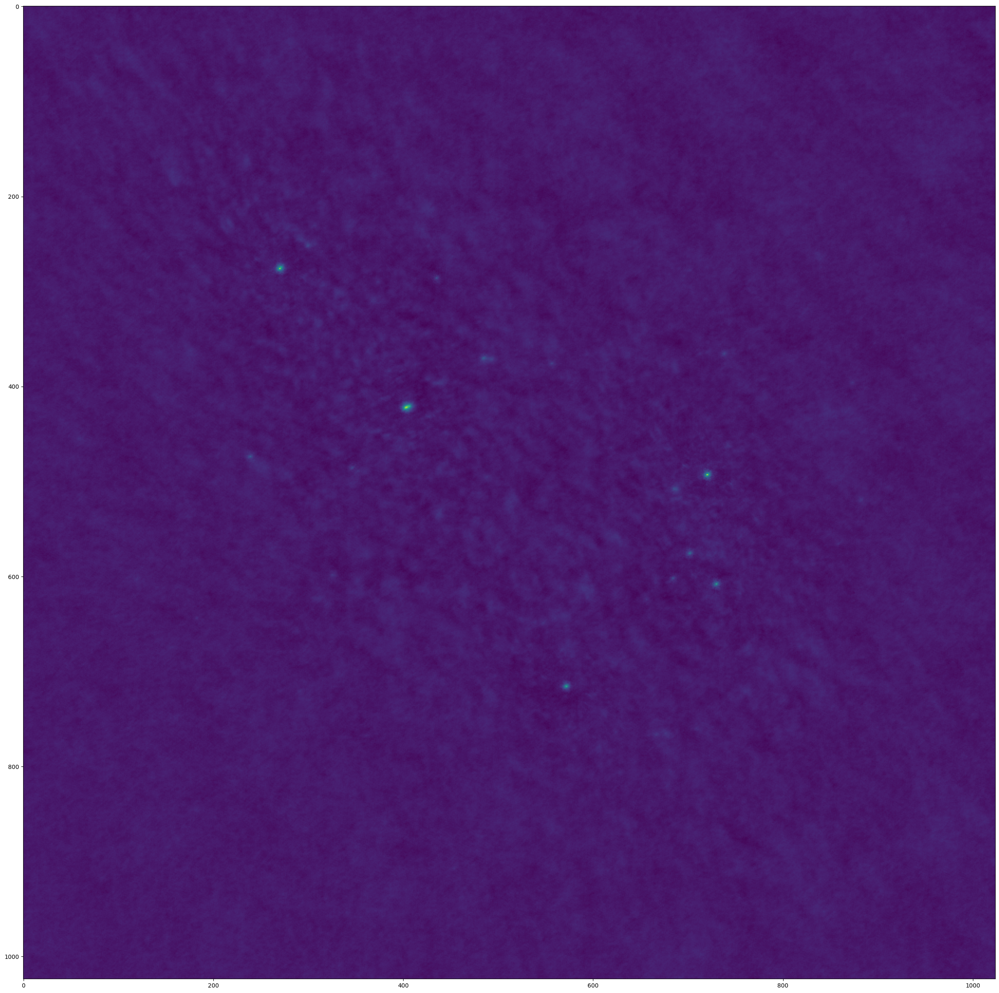

In [5]:
pylab.figure(figsize=(30,30)); pylab.imshow(img.T);

To make the image a bit better, the following does a quick Hogbom CLEAN pass. Clearly there are much better ways to do this, but it seems like none of them are readily `pip`-installable, so here's a quick version using `numpy`.

In [6]:
psf = ducc0.wgridder.ms2dirty(
    tbl.getcol('UVW')[~autocorr_filter], spec.getcol('CHAN_FREQ')[0], numpy.ones_like(vis[~autocorr_filter]),
    npix_x=img_size*2, npix_y=img_size*2, pixsize_x=pixsize, pixsize_y=pixsize, epsilon=1e-3, do_wstacking=True,
)
psf /= psf[psf.shape[0]//2,psf.shape[1]//2]

In [7]:
beam_size = 1
beam = scipy.signal.windows.gaussian(psf.shape[0], std=beam_size)[:, None] * scipy.signal.windows.gaussian(psf.shape[0], std=beam_size)

In [8]:
img_dec = numpy.array(img)
out_image = numpy.zeros_like(img)
gain = 0.1
half_size = img.shape[0]//2
for i in range(600):
    y_max, x_max = numpy.unravel_index(numpy.argmax(img_dec), img_dec.shape)
    val = gain * img_dec[y_max,x_max]
    d_y, d_x = (y_max-img.shape[0]//2, x_max-img.shape[1]//2)
    out_image += val*beam[half_size-d_y:-half_size-d_y, half_size-d_x:-half_size-d_x]
    img_dec -= val*psf[half_size-d_y:-half_size-d_y, half_size-d_x:-half_size-d_x]

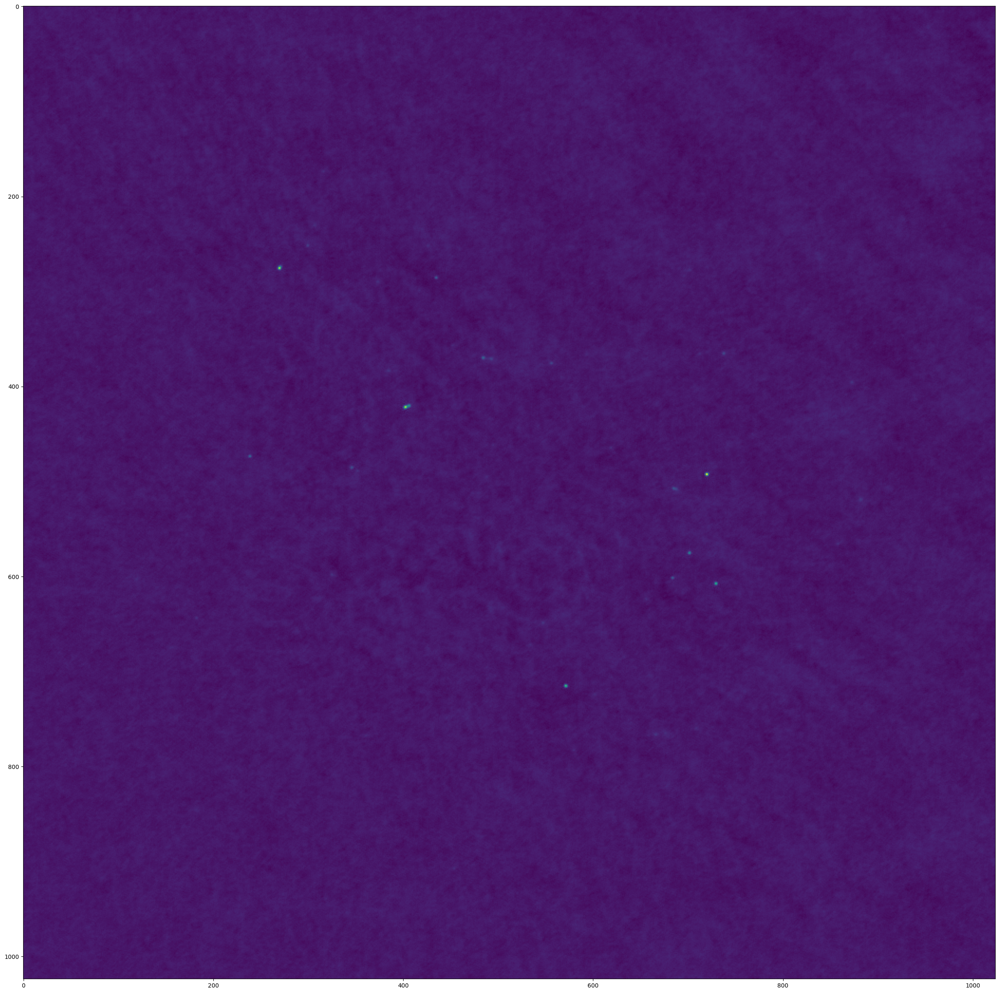

In [9]:
pylab.figure(figsize=(30,30)); pylab.imshow((out_image+img_dec).T);

This looks a bit better, but clearly this notebook is still a far cry from how one would go about making images in reality. So what would your approach be? We are looking forward to your answers!